In [141]:
# Supress Warnings 
import warnings
warnings.filterwarnings('ignore')

# Plotting
import matplotlib.pyplot as plt

# Data science
import pandas as pd
import seaborn as sns
import numpy as np

# Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

# Geospatial
import contextily as cx
from shapely.geometry import Point, Polygon
import xarray as xr
import rasterio.features
import rasterio as rio
import fsspec

# API
import requests
import json

# Import Planetary Computer
import stackstac
import pystac
import pystac_client
import planetary_computer

# Other
import os
from itertools import cycle
from tqdm import tqdm
import geopandas as gpd
from shapely.geometry import box
from sklearn.preprocessing import LabelEncoder

# Folder to store extracted files
storage_path = './files/output/'

# Path to data folder with provided material
data_path = './'

pwd = os.getcwd()

## Response Variable

Before we can build our model, we need to load in the frog occurrences data and generate our response variable. To do this, we first need to unzip the training data and store it on our machine. Then we can write a function that abstracts the loading process, with the option of providing a bounding box to only take those occurrences within a region of interest.


In [142]:
if not os.path.exists(data_path+'/training_data/'):
    os.mkdir(data_path+'/training_data/')
    with zipfile.ZipFile(data_path+'/GBIF_training_data.zip', 'r') as zip_ref:
        zip_ref.extractall(data_path+'/training_data/')
        
def filter_bbox(frogs, bbox):
    frogs = frogs[lambda x: 
        (x.decimalLongitude >= bbox[0]) &
        (x.decimalLatitude >= bbox[1]) &
        (x.decimalLongitude <= bbox[2]) &
        (x.decimalLatitude <= bbox[3])
    ]
    return frogs

def get_frogs(file, year_range=None, bbox=None):
    """Returns the dataframe of all frog occurrences for the bounding box specified."""
    columns = [
        'gbifID','eventDate','country','continent','stateProvince',
        'decimalLatitude','decimalLongitude','species'
    ]
    country_names = {
        'AU':'Australia', 'CR':'Costa Rica', 'ZA':'South Africa','MX':'Mexico','HN':'Honduras',
        'MZ':'Mozambique','BW':'Botswana','MW':'Malawi','CO':'Colombia','PA':'Panama','NI':'Nicaragua',
        'BZ':'Belize','ZW':'Zimbabwe','SZ':'Eswatini','ZM':'Zambia','GT':'Guatemala','LS':'Lesotho',
        'SV':'El Salvador', 'AO':'Angola', np.nan:'unknown or invalid'
    }
    continent_names = {
        'AU':'Australia', 'CR':'Central America', 'ZA':'Africa','MX':'Central America','HN':'Central America',
        'MZ':'Africa','BW':'Africa','MW':'Africa','CO':'Central America','PA':'Central America',
        'NI':'Central America','BZ':'Central America','ZW':'Africa','SZ':'Africa','ZM':'Africa',
        'GT':'Central America','LS':'Africa','SV':'Central America','AO':'Africa', np.nan:'unknown or invalid' 
    }
    frogs = (
        pd.read_csv(data_path+'occurrence.txt', sep='\t', parse_dates=['eventDate'])
        .assign(
            country =  lambda x: x.countryCode.map(country_names),
            continent =  lambda x: x.countryCode.map(continent_names),
            species = lambda x: x.species.str.title()
        )
        [columns]
    )
    if year_range is not None:
        frogs = frogs[lambda x: 
            (x.eventDate.dt.year >= year_range[0]) & 
            (x.eventDate.dt.year <= year_range[1])
        ]
    if bbox is not None:
        frogs = filter_bbox(frogs, bbox)
    return frogs

### Sub-sampling

For this demonstration, we will constrain our search to frogs in the Greater Sydney area found between the start of 2015 to the end of 2019. This gives a varied landscape of bushland, plains, rivers, and urban areas. This is done by providing `year_range` and `bbox` parameters to the get_frogs function we defined above.

In [143]:
# # Define the bounding box for Greater Sydney, NSW
# region_name = 'Greater Sydney, NSW'
# min_lon, min_lat = (150.15, -34.25)  # Lower-left corner
# max_lon, max_lat = (151.15, -33.25)  # Upper-right corner
# bbox = (min_lon, min_lat, max_lon, max_lat)

# # Load in data
# all_frog_data = get_frogs(pwd + '/occurrence.txt', year_range=(2015, 2019), bbox=bbox)
# all_frog_data

In [144]:
# Initialize an empty DataFrame to store the combined data
combined_data = pd.DataFrame()
bounding_boxes = {
    'South West': (114, -36, 120, -30),
    'South East': (140, -40, 155, -30),
    'Eastern Coast': (145, -30, 155, -15),
    'Northern': (125, -22, 145, -12)
}
# Load in data for each region and concatenate it with the combined data
pwd = os.getcwd()
for region_name, bbox in bounding_boxes.items():
    min_lon, min_lat, max_lon, max_lat = bbox
    region_data = get_frogs(pwd + '/occurrence.txt', 
                            year_range=(1950, 2024), bbox=(min_lon, min_lat, max_lon, max_lat))
    region_data['region'] = region_name  # Add a column to identify the region
    combined_data = pd.concat([combined_data, region_data], ignore_index=True)

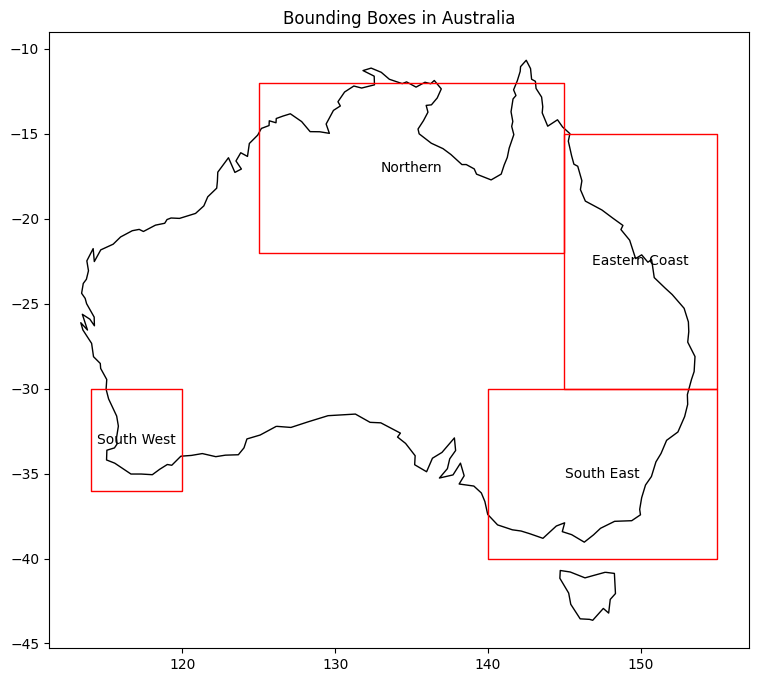

In [145]:
# Create a GeoDataFrame with the bounding boxes and region names
geometries = [box(*bbox) for bbox in bounding_boxes.values()]
gdf = gpd.GeoDataFrame(geometry=geometries, crs='EPSG:4326')
gdf['Region'] = bounding_boxes.keys()

# Load a map of Australia
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Plot the map of Australia
ax = world[world.name == 'Australia'].plot(color='white', edgecolor='black', figsize=(10, 8))

# Plot the bounding boxes on top of the map
gdf.plot(ax=ax, color='none', edgecolor='r')

# Annotate the regions
for x, y, label in zip(gdf.geometry.centroid.x, gdf.geometry.centroid.y, gdf['Region']):
    ax.text(x, y, label, fontsize=10, ha='center', va='center', color='black')

# Set title
ax.set_title('Bounding Boxes in Australia')

# Show plot
plt.show()


#### Extracting data from occurrence.txt from these boxes since various frog species are centered around these regions. Using data outside of this would increase our computational expenses and it might not be worth it.

#### Spatial sampling

While we have restricted our analysis to Greater Sydney for this demonstration,  you are encouraged to explore different areas to assist in creating a SDM that is representative of the habitat of litoria fallax. You could even use the entire training set, but keep in mind that loading in large areas may be quite computationally expensive. We recommend loading data in chunks that are a similar size to the bounding box we defined above.

#### Temporal sampling

Another area that may assist you in developing your SDM is the time dimension of the data. Each occurrence has an "eventDate" attribute, and the terraclimate data is taken monthly. You may want to consider whether more closely matching occurrences to timely data will improve your model. Another idea is to pool the data into larger time chunks like we have done in this notebook. This could involve extending our approach of binning the data in 5 year intervals to include occurrence data for 2010-2015, 2005-2009, etc. Either approach would allow you to utilise more of the training data which could greatly assist your SDM training.

### Addressing bias

Below we define some functions to assist in plotting the frog data. This will assist us in identifying two main areas of bias. We then use these functions to plot the frog species distributions of each country. A more detailed exploration of the training dataset for this challenge can be found in the [dataset summary notebook](supplementary_notebooks/dataset_summary.ipynb).

In [146]:
def plot_barchart(bar_data, ax, bar_params={}, fold_text=True):
    barchart = ax.bar(bar_data.index, bar_data, **bar_params)
    prop_cycle = cycle(plt.rcParams['axes.prop_cycle'])
    for i, color in zip(range(len(bar_data)), prop_cycle):
        var_name = bar_data.index[i]
        barchart[i].set_color(color['color'])
        barchart[i].set_label(f"{var_name}\nCount: {bar_data[i]}")
    ax.set_xticklabels(bar_data.index.str.replace(' ', '\n'), rotation=45)
    ax.legend()

#### samples of species other than littoria fallax that were in extreme proximity to littoria fallax are removed through the above process and hence, the dataset size reduction. 

In [147]:
all_frog_data = combined_data

In [148]:
from scipy.spatial import cKDTree

def euclidean_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

# Create a KD-tree index for Litoria Fallax occurrences
lf_points = all_frog_data[all_frog_data['species'] == 'Litoria Fallax'][['decimalLatitude', 'decimalLongitude']].values
lf_tree = cKDTree(lf_points)

# Define threshold distance
threshold_distance = 0.1  # Adjust as needed
# Define species to remove
species_to_remove = ['Crinia Signifera', 'Austrochaperina Pluvialis', 'Ranoidea Australis']

# Iterate through each occurrence of specified species
indices_to_remove = []
for index, row in tqdm(all_frog_data.iterrows(), total=len(all_frog_data), desc="Processing"):
    if row['species'] in species_to_remove:
        species_lat = row['decimalLatitude']
        species_lon = row['decimalLongitude']
        
        # Query the KD-tree to find the nearest Litoria Fallax occurrence
        _, nearest_lf_idx = lf_tree.query([species_lat, species_lon])
        nearest_lf_point = lf_points[nearest_lf_idx]
        
        # Calculate distance
        distance = euclidean_distance(species_lat, species_lon, nearest_lf_point[0], nearest_lf_point[1])
        
        # If distance is below threshold, mark for removal
        if distance < threshold_distance:
            indices_to_remove.append(index)

# Remove occurrences marked for removal
filtered_data = all_frog_data.drop(indices_to_remove)

# Output the filtered dataset
print(filtered_data)


Processing:  32%|███▏      | 51003/161569 [00:02<00:02, 42094.11it/s]

Processing: 100%|██████████| 161569/161569 [00:04<00:00, 36188.21it/s]

            gbifID  eventDate    country  continent      stateProvince  \
0       1100473231 1970-05-09  Australia  Australia  Western Australia   
1       1100474542 1973-03-30  Australia  Australia  Western Australia   
2       1100513974 1972-02-03  Australia  Australia  Western Australia   
3       1100513970 1972-02-03  Australia  Australia  Western Australia   
4       1100473190 1970-05-09  Australia  Australia  Western Australia   
...            ...        ...        ...        ...                ...   
161564   476550867 1968-06-23  Australia  Australia         Queensland   
161565   476550638 1968-07-07  Australia  Australia         Queensland   
161566   476552108 1968-07-07  Australia  Australia         Queensland   
161567   476476020 1968-06-17  Australia  Australia         Queensland   
161568   476551999 1968-06-16  Australia  Australia         Queensland   

        decimalLatitude  decimalLongitude           species      region  
0               -31.950        115.85

In [149]:
# Show size of all_frog_data before
print("Size of all_frog_data before:", all_frog_data.shape)
all_frog_data = filtered_data
# Show size of all_frog_data after
print("Size of all_frog_data after:", all_frog_data.shape)


Size of all_frog_data before: (161569, 9)
Size of all_frog_data after: (98763, 9)


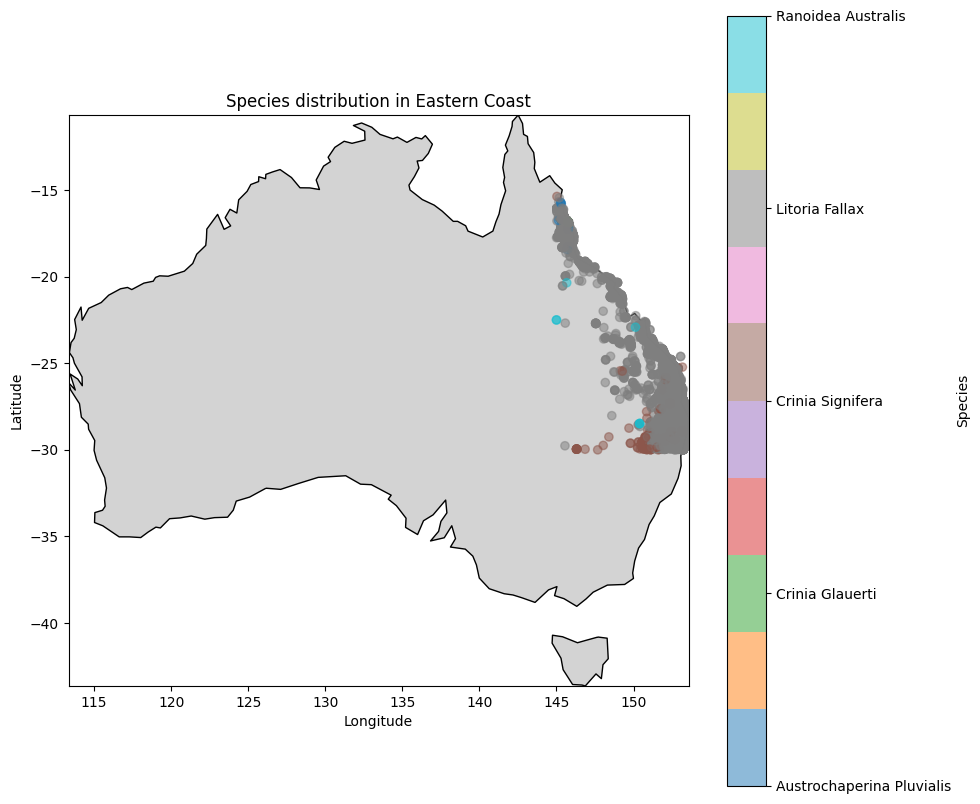

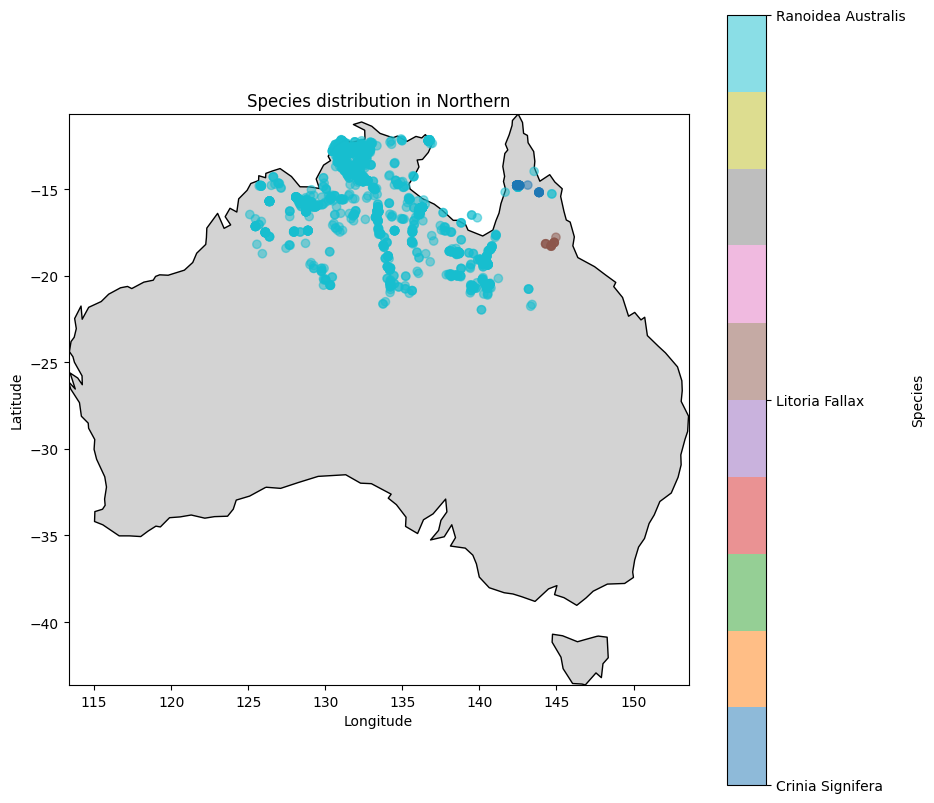

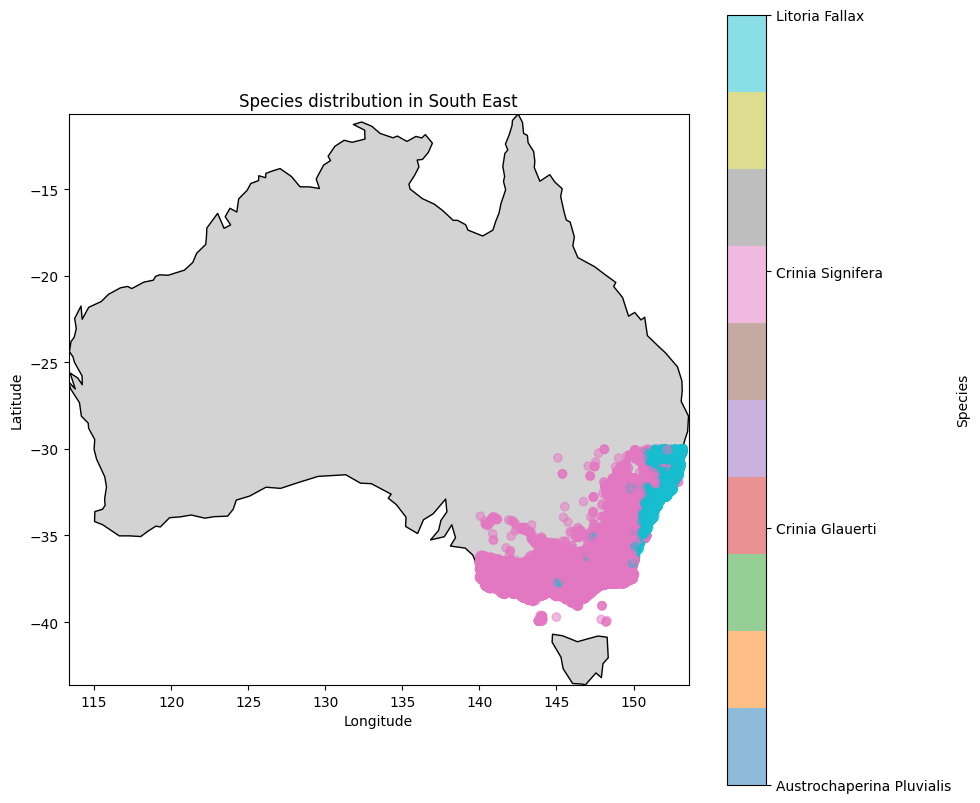

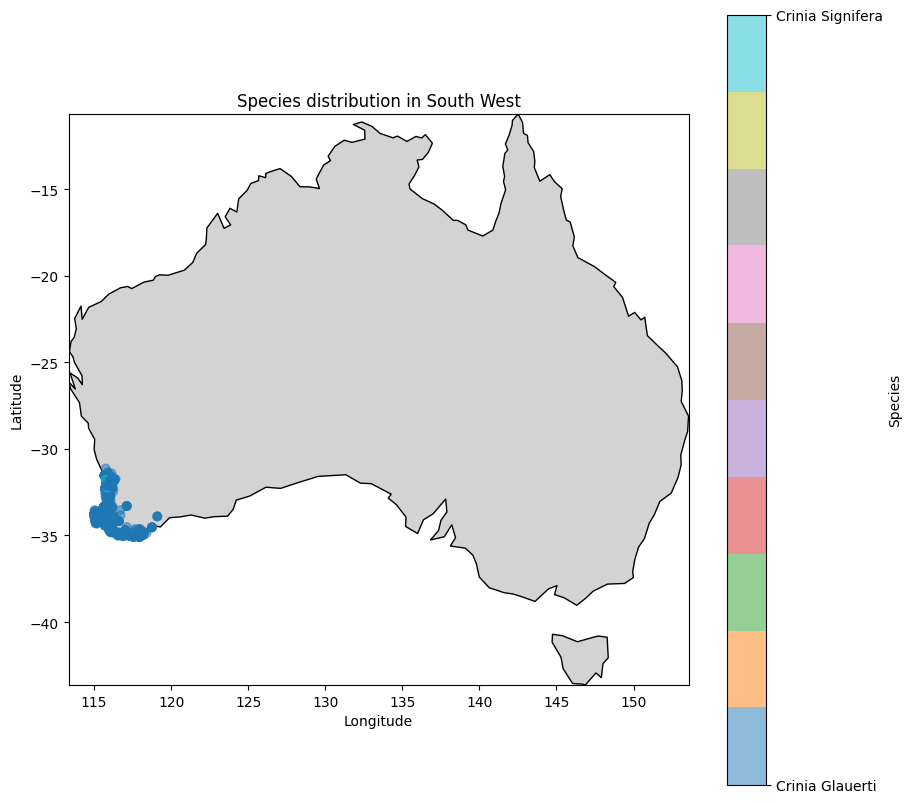

In [150]:
def plot_species(data):
    # Encode species names to numeric values
    label_encoder = LabelEncoder()
    data['species_encoded'] = label_encoder.fit_transform(data['species'])
    species_labels = label_encoder.classes_

    # Load the base map of Australia
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    
    for region_name, region_data in data.groupby('region'):
        fig, ax = plt.subplots(figsize=(10, 10))
        
        # Plot the base map of the region
        region_boundary = world[world.name == "Australia"].geometry.bounds.values[0]
        region_map = world.cx[region_boundary[0]:region_boundary[2], region_boundary[1]:region_boundary[3]]
        region_map.plot(ax=ax, color='lightgrey', edgecolor='black')
        
        # Plot species distribution as scatter plot
        scatter = ax.scatter(region_data['decimalLongitude'], region_data['decimalLatitude'], c=region_data['species_encoded'], cmap='tab10', alpha=0.5)
        
        # Customize plot
        ax.set_title(f'Species distribution in {region_name}')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.grid(False)  # Remove grid
        ax.set_xlim(region_boundary[0], region_boundary[2])
        ax.set_ylim(region_boundary[1], region_boundary[3])
        
        # Add legend with decoded species names
        legend_labels = [species_labels[i] for i in range(len(species_labels))]
        plt.colorbar(scatter, ticks=range(len(legend_labels)), label='Species').set_ticklabels(legend_labels)

        plt.show()

# Call the function with your data
plot_species(all_frog_data)


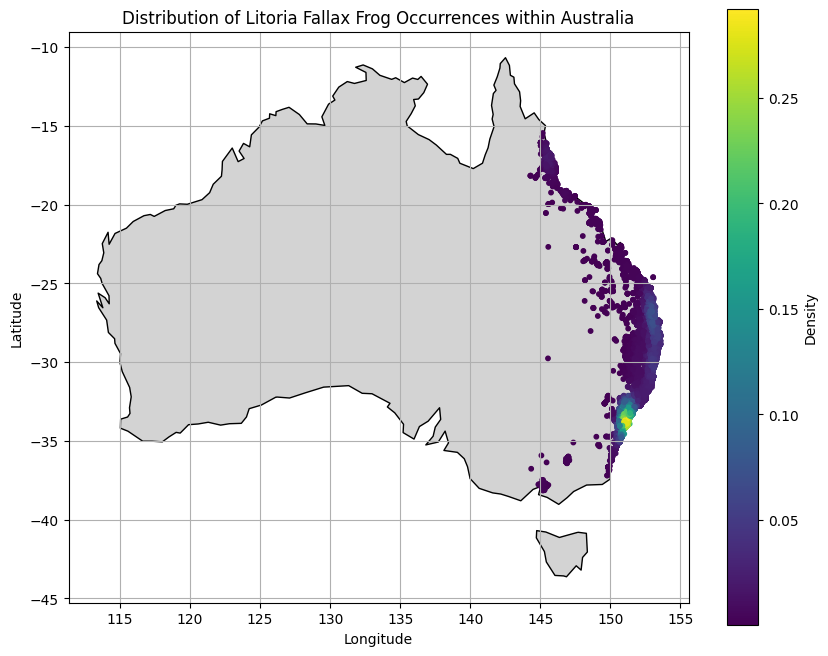

In [160]:
import matplotlib.pyplot as plt
import geopandas as gpd
from scipy.stats import gaussian_kde

# Load the world shapefile
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter frog occurrence data for Australia and Litoria Fallax species
australia = world[world['name'] == 'Australia']
australia_bounds = australia.bounds.iloc[0]

# Extract latitude and longitude coordinates for Australia and Litoria Fallax species
australia_data = all_frog_data[(all_frog_data['decimalLongitude'] >= australia_bounds['minx']) & 
                               (all_frog_data['decimalLongitude'] <= australia_bounds['maxx']) &
                               (all_frog_data['decimalLatitude'] >= australia_bounds['miny']) &
                               (all_frog_data['decimalLatitude'] <= australia_bounds['maxy']) &
                               (all_frog_data['species'] == 'Litoria Fallax')]

latitudes = australia_data['decimalLatitude']
longitudes = australia_data['decimalLongitude']

# Calculate kernel density estimation (KDE) for the coordinates within Australia
kde = gaussian_kde([latitudes, longitudes])
density = kde([latitudes, longitudes])

# Plot the density on the Australian map
plt.figure(figsize=(10, 8))

# Plot the Australian map
australia.plot(ax=plt.gca(), color='lightgray', edgecolor='black')

# Create the scatter plot with density colors for Litoria Fallax frog occurrences within Australia
plt.scatter(longitudes, latitudes, c=density, cmap='viridis', s=10)

# Add colorbar
plt.colorbar(label='Density')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Distribution of Litoria Fallax Frog Occurrences within Australia')

plt.grid(True)
plt.show()


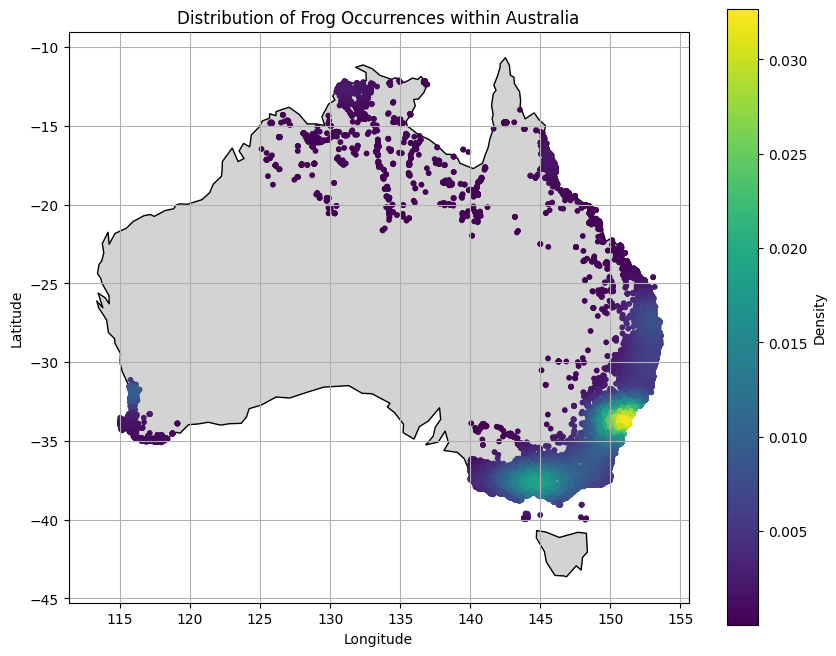

In [165]:
import matplotlib.pyplot as plt
import geopandas as gpd
from scipy.stats import gaussian_kde
import plotly.graph_objects as go

# Load the world shapefile
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter frog occurrence data for Australia
australia = world[world['name'] == 'Australia']
australia_bounds = australia.bounds.iloc[0]

# Extract latitude and longitude coordinates for Australia
australia_data = all_frog_data[(all_frog_data['decimalLongitude'] >= australia_bounds['minx']) & 
                               (all_frog_data['decimalLongitude'] <= australia_bounds['maxx']) &
                               (all_frog_data['decimalLatitude'] >= australia_bounds['miny']) &
                               (all_frog_data['decimalLatitude'] <= australia_bounds['maxy'])]

latitudes = australia_data['decimalLatitude']
longitudes = australia_data['decimalLongitude']

# Calculate kernel density estimation (KDE) for the coordinates within Australia
kde = gaussian_kde([latitudes, longitudes])
density = kde([latitudes, longitudes])

# Plot the density on the Australian map
plt.figure(figsize=(10, 8))

# Plot the Australian map
australia.plot(ax=plt.gca(), color='lightgray', edgecolor='black')

# Create the scatter plot with density colors for frog occurrences within Australia
plt.scatter(longitudes, latitudes, c=density, cmap='viridis', s=10)

# Add colorbar
plt.colorbar(label='Density')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Distribution of Frog Occurrences within Australia')

plt.grid(True)
plt.show()

# Create 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=longitudes,
    y=latitudes,
    z=density,
    mode='markers',
    marker=dict(
        size=5,
        color=density,
        colorscale='Viridis',
        opacity=0.8
    )
)])

# Update layout
fig.update_layout(
    scene=dict(
        xaxis=dict(title='Longitude'),
        yaxis=dict(title='Latitude'),
        zaxis=dict(title='Density'),
        aspectmode='cube'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

# Show plot
fig.show()


#### Sampling bias



The plot above shows how frog occurrences are heavily biased around urban areas, where people are more likely to come across them. They also cluster tightly around towns, parks, bush trails etc. This is one issue that would be worth addressing to maximise success in this challenge.

One method of addressing the sampling bias inherent in the database is to use the occurrence points of other species as absence points for the target species. This is called pseudo-absence and is a common technique in species distribution modelling. This way, if a different species of frog has been sighted in a specific location, we can be more certain that the species we are trying to predict is not at that same location. Alternatively, if we just picked a random point where there are no frog occurrences, we cannot be certain that frogs are not in that location. It might just be that there are no walking tracks near that location, and therefore the frogs would not show up in our database.

For this notebook, we will use the other species, crinia signifera - the common eastern froglet, as examples of litoria fallax's absence. We will alter our response variable to be `occurenceStatus` which will take the value of 1 if the occurrence species is litoria fallax, and 0 if the species is not litoria fallax (i.e. is crinia signifera).

In [11]:
target_species = 'Litoria Fallax'

all_frog_data = (
    all_frog_data
    # Assign the occurrenceStatus to 1 for the target species and 0 for all other species.
    # as well as a key for joining (later)
    .assign(
        occurrenceStatus = lambda x: np.where(x.species == target_species, 1, 0)
    )
)
all_frog_data

,gbifID,eventDate,country,continent,stateProvince,decimalLatitude,decimalLongitude,species,region,species_encoded,occurrenceStatus
0,1100473231,1970-05-09,Australia,Australia,Western Australia,-31.950,115.850000,Crinia Glauerti,South West,1,0
1,1100474542,1973-03-30,Australia,Australia,Western Australia,-34.833,116.550000,Crinia Glauerti,South West,1,0
2,1100513974,1972-02-03,Australia,Australia,Western Australia,-34.733,116.083000,Crinia Glauerti,South West,1,0
3,1100513970,1972-02-03,Australia,Australia,Western Australia,-34.733,116.083000,Crinia Glauerti,South West,1,0
4,1100473190,1970-05-09,Australia,Australia,Western Australia,-31.950,115.850000,Crinia Glauerti,South West,1,0
...,...,...,...,...,...,...,...,...,...,...,...
161564,476550867,1968-06-23,Australia,Australia,Queensland,-14.790,142.429993,Crinia Signifera,Northern,2,0
161565,476550638,1968-07-07,Australia,Australia,Queensland,-14.790,142.589996,Crinia Signifera,Northern,2,0
161566,476552108,1968-07-07,Australia,Australia,Queensland,-14.790,142.589996,Crinia Signifera,Northern,2,0
161567,476476020,1968-06-17,Australia,Australia,Queensland,-15.190,143.869995,Crinia Signifera,Northern,2,0


In [12]:
all_frog_data['occurrenceStatus'].value_counts()

occurrenceStatus
0    51991
1    46772
Name: count, dtype: int64

#### Class Balancing

Another bias shown in the above visualisations is the class imbalance. To handle this, we will down-sample the absence points so that their numbers match that of the target species. Note that this is quite a naive approach as an isolated frog occurrence may be lost while clusters of occurrences are more likely to persist. This may not be ideal, as these isolated occurrences are often the most important data points available for frog conservationists. Developing a smarter sampling method may be a worthwhile pursuit when considering ways to improve your model.

The barcharts below show the response variable before and after the classes have been balanced.

Text(0.5, 1.0, 'Balanced training set')

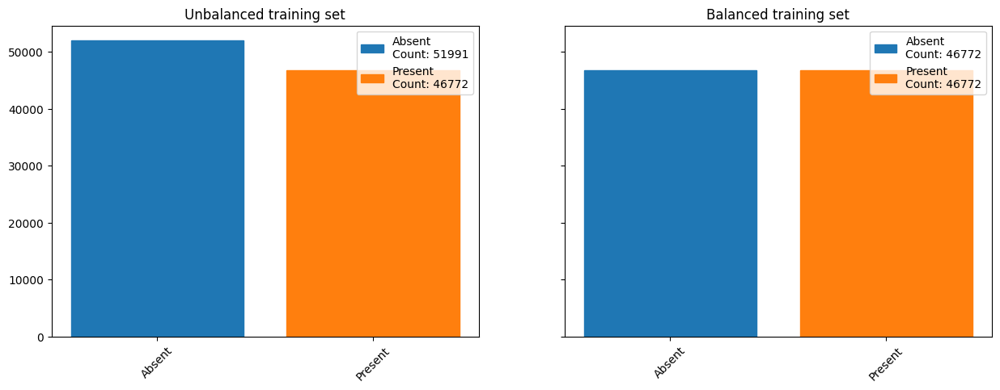

In [13]:
target_species_frog_data = all_frog_data[all_frog_data.occurrenceStatus == 1]

# Determine the number of samples needed from the occurrenceStatus == 0 subset
sample_size = min(len(target_species_frog_data), len(all_frog_data[all_frog_data.occurrenceStatus == 0]))

# Sample from the occurrenceStatus == 0 subset with the determined sample size
frog_data = (
    pd.concat([
        all_frog_data.loc[all_frog_data.occurrenceStatus == 0].sample(sample_size, random_state=420, replace=False),
        target_species_frog_data
    ])
    .reset_index(drop=True)
    .assign(key=lambda x: x.index)
)

# Bar charts
fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharey=True, sharex=True)
bar_data = all_frog_data.occurrenceStatus.map({1: 'Present', 0: 'Absent'}).value_counts()
plot_barchart(bar_data, ax[0], bar_params={})
ax[0].set_title('Unbalanced training set')

balanced_bar_data = frog_data.occurrenceStatus.map({1: 'Present', 0: 'Absent'}).value_counts()
plot_barchart(balanced_bar_data, ax[1], bar_params={})
ax[1].set_title('Balanced training set')


After assigning absence points and balancing the classes, we finally have our training data visualised below. Again, it must be stressed that this is just one way of addressing the sampling bias and class imbalances inherent in the GBIF data and it does not address these biases completely. Since we will be using this training dataset for evaluation, the evaluation metrics will also contain bias. You are encouraged to improve the response variable creation process until you are confident in its ability to accurately train and evaluate your SDM for litoria fallax. For now, we will continue with this training set.


Text(0.5, 1.0, 'Training set for Northern')

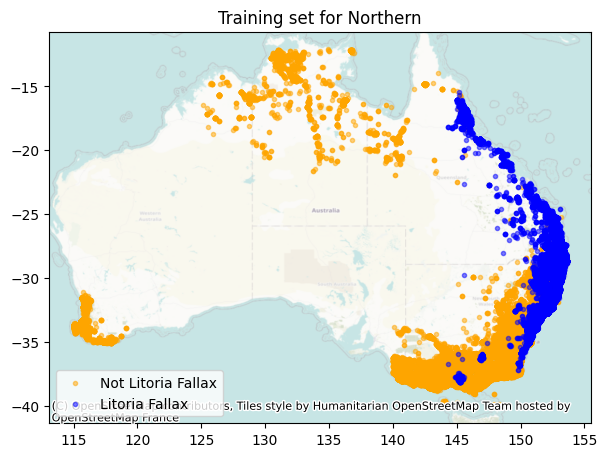

In [15]:
fig, ax = plt.subplots(figsize = (7, 7))

filt = all_frog_data.occurrenceStatus == 1
ax.scatter(all_frog_data[~filt].decimalLongitude, all_frog_data[~filt].decimalLatitude,
           color = 'orange', marker='.', alpha=0.5, label=f"Not {target_species}")
ax.scatter(all_frog_data[filt].decimalLongitude, all_frog_data[filt].decimalLatitude,
           color = 'blue', marker='.', alpha=0.5, label=target_species)
ax.legend()
cx.add_basemap(ax, crs={'init':'epsg:4326'}, alpha=0.5)
ax.set_title(f"Training set for {region_name}")

## Predictor Variables

Now that we have our response variable, it is time to gather the predictor variables from the TerraClimate dataset. For a more in-depth look at the TerraClimate dataset and how to query it, see the [TerraClimate supplementary notebook](./supplementary_notebooks/TerraClimate.ipynb)

### Accessing the TerraClimate Data

To get the TerraClimate data, we write a function called `get_terraclimate`. This function will fetch all data intersecting with the bounding box and will calculate various metrics over the time dimension for each coordinate. In this example, we will take four metrics from four assets, namely the mean maximum monthly air temp (`tmax_mean`), mean minimum monthly air temp (`tmin_mean`), mean accumulated precipitation (`ppt_mean`) and mean soil moisture (`soil_mean`), all calculated over a five year timeframe from the start of 2015 to the end of 2019.

To assist in visualisations, this function has an interpolation functionality which will allow the comparitively coarse temporal resolution of the terraclimate data to be mapped to a larger set of coordinates, creating an ($n$ x $m$) image. We will choose (512 x 512).


In [16]:
def get_terraclimate(bbox, metrics, time_slice=None, assets=None, features=None, interp_dims=None, verbose=True):
    """Returns terraclimate metrics for a given area, allowing results to be interpolated onto a larger image.
    
    Attributes:
    bbox -- Tuple of (min_lon, min_lat, max_lon, max_lat) to define area
    metrics -- Nested dictionary in the form {<metric_name>:{'fn':<metric_function>,'params':<metric_kwargs_dict>}, ... }
    time_slice -- Tuple of datetime strings to select data between, e.g. ('2015-01-01','2019-12-31')
    assets -- list of terraclimate assets to take
    features -- list of asset metrics to take, specified by strings in the form '<asset_name>_<metric_name>'
    interp_dims -- Tuple of dimensions (n, m) to interpolate results to
    """
    min_lon, min_lat, max_lon, max_lat = bbox
    
    collection = pystac.read_file("https://planetarycomputer.microsoft.com/api/stac/v1/collections/terraclimate")
    asset = collection.assets["zarr-https"]
    store = fsspec.get_mapper(asset.href)
    asset.extra_fields = {"xarray:open_kwargs":  {'chunks': {}, 'consolidated': True}}
    data = xr.open_zarr(store, **asset.extra_fields["xarray:open_kwargs"])
    
    # Select datapoints that overlap region
    if time_slice is not None:
        data = data.sel(lon=slice(min_lon,max_lon),lat=slice(max_lat,min_lat),time=slice(time_slice[0],time_slice[1]))
    else:
        data = data.sel(lon=slice(min_lon,max_lon),lat=slice(max_lat,min_lat))
    if assets is not None:
        data = data[assets]
    print('Loading data') if verbose else None
    data = data.rename(lat='y', lon='x').to_array().compute()
        
    # Calculate metrics
    combined_values = []
    combined_bands = []
    for name, metric in metrics.items():
        print(f'Calculating {name}') if verbose else None
        sum_data = xr.apply_ufunc(
            metric['fn'], data, input_core_dims=[["time"]], kwargs=metric['params'], dask = 'allowed', vectorize = True
        ).rename(variable='band')
        xcoords = sum_data.x
        ycoords = sum_data.y
        dims = sum_data.dims
        combined_values.append(sum_data.values)
        for band in sum_data.band.values:
            combined_bands.append(band+'_'+name)
        
    # Combine metrics
    combined_values = np.concatenate(
        combined_values,
        axis=0
    )
    combined_data = xr.DataArray(
        data=combined_values,
        dims=dims,
        coords=dict(
            band=combined_bands,
            y=ycoords,
            x=xcoords
        )
    )    

    # Take relevant bands:
    combined_data = combined_data.sel(band=features)
    
    if interp_dims is not None:
        print(f'Interpolating image') if verbose else None
        interp_coords = (np.linspace(bbox[0], bbox[2], interp_dims[0]), np.linspace(bbox[1], bbox[3], interp_dims[1]))
        combined_data = combined_data.interp(x=interp_coords[0], y=interp_coords[1], method='nearest', kwargs={"fill_value": "extrapolate"})
    
    return combined_data

Below, we define the products to take from TerraClimate in `assets` and the metrics to calculate from them in `tc_metrics`. Each metric is applied to each asset, so to pick the desired asset/metric pairs we define a list of strings in the form '\<asset\>_\<metric\>' in `features`. 

In [69]:
# # Metrics to measure over time dimension
# tc_metrics = {
#     'mean': {
#         'fn': np.nanmean,
#         'params':{}
#     },
#     'min':{
#         'fn':np.nanmin,
#         'params':{}
#     },
#     'max':{
#         'fn':np.nanmax,
#         'params':{}
#     }
# }

# # Date range to take
# time_slice = ('2015-01-01','2019-12-31')

# # Measurements to take
# assets=['tmax', 'tmin', 'ppt', 'soil', 'aet', 'pet']

# # Features to take, in form '<asset>_<metric>'
# features=['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean', 'pet_mean']

# # Interpolate values to a 512x512 image
# interp_dims = (512, 512)

# min_lon, min_lat = (110, -45)  # Lower-left corner
# max_lon, max_lat = (160, -10)  # Upper-right corner
# bbox_Australia = (min_lon, min_lat, max_lon, max_lat)

# weather_data = get_terraclimate(bbox_Australia, tc_metrics, time_slice=time_slice, assets=assets, features=features, interp_dims=interp_dims)
# display(weather_data.band.values)

Loading data
Calculating mean
Calculating min
Calculating max
Interpolating image


array(['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean',
       'pet_mean'], dtype='<U9')

### Visualising the TerraClimate Data

The spatial distribution of the four variables are displayed below.

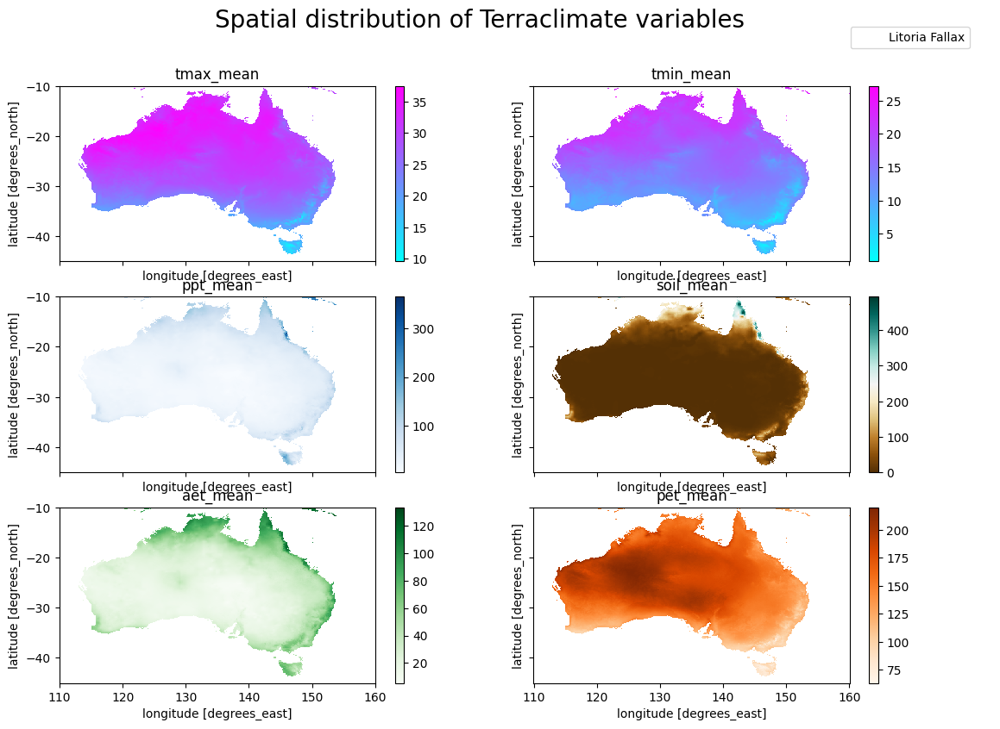

In [75]:
nrow = 3
ncol = 2
fig, ax = plt.subplots(nrow, ncol, figsize=(13, 9), sharex=True, sharey=True)

bands = weather_data.band.values
filt = frog_data.occurrenceStatus == 1
cmaps = ["cool", "cool", "Blues", "BrBG", "Greens", "Oranges"]

for i in range(len(bands)):
    xr.plot.imshow(weather_data[i], 'x', 'y', cmap=cmaps[i], ax=ax[i//ncol, i%ncol]) 
    ax[i//ncol, i%ncol].set_title(bands[i])
    ax[i//ncol, i%ncol].scatter(frog_data[filt].decimalLongitude, frog_data[filt].decimalLatitude,
                                color='yellow', marker='.', alpha=0, label=target_species if i==0 else '')

fig.suptitle("Spatial distribution of Terraclimate variables", fontsize=20)
fig.legend(loc=(0.85, 0.933))


### Feature engineering

The frequency distribution of each variable is displayed below. There is some skewness present in a few variables, so you might want to address this when training your own model. Depending on the type of model you decide to train, some of the variables might require normalisation, standardisation, or transformation. For now, we will proceed with the variables as they come.

### Joining Pretictors to the Response Variable

Now that we have read in our predictor variables, we need to join them onto the response variable of frogs. To do this, we loop through the frog occurrence data and assign each frog occurrence the closest predictor pixel value from each of the predictor variables based on the geo-coordinates. The `sel` method of the xarray dataarray comes in handy here.

In [76]:
def join_frogs(frogs, data):
    """Collects the data for each frog location and joins it onto the frog data 

    Arguments:
    frogs -- dataframe containing the response variable along with ["decimalLongitude", "decimalLatitude", "key"]
    data -- xarray dataarray of features, indexed with geocoordinates

    """
    return frogs.merge(
        (
            data
            .rename('data')
            .sel(
                x=xr.DataArray(frogs.decimalLongitude, dims="key", coords={"key": frogs.key}), 
                y=xr.DataArray(frogs.decimalLatitude, dims="key", coords={"key": frogs.key}),
                method="nearest"
            )
            .to_dataframe()
            .assign(val = lambda x: x.iloc[:, -1])
            [['val']]
            .reset_index()
            .drop_duplicates()
            .pivot(index="key", columns="band", values="val")
            .reset_index()
        ),
        on = ['key'],
        how = 'inner'
    )

model_data = join_frogs(frog_data, weather_data)
model_data.head()

,gbifID,eventDate,country,continent,stateProvince,decimalLatitude,decimalLongitude,species,region,species_encoded,occurrenceStatus,key,aet_mean,pet_mean,ppt_mean,soil_mean,tmax_mean,tmin_mean
0,3463473087,2020-07-30 00:00:00,Australia,Australia,Western Australia,-31.927700,115.914000,Crinia Glauerti,South West,1,0,0,47.598334,140.043336,52.176667,58.045001,24.345166,13.365333
1,2597189902,2018-10-25 20:37:00,Australia,Australia,New South Wales,-35.571732,149.269403,Crinia Signifera,South East,2,0,1,44.343334,101.368335,50.091667,13.678334,19.437166,5.848833
2,3463503927,2020-11-04 00:00:00,Australia,Australia,Victoria,-38.012763,145.867080,Crinia Signifera,South East,2,0,2,71.668335,97.538335,80.643333,134.446668,19.647166,8.584666
3,3108846946,2019-03-28 00:00:00,Australia,Australia,New South Wales,-33.037354,149.407112,Crinia Signifera,South East,2,0,3,51.881668,110.875003,58.223333,21.965001,20.368833,7.130333
4,1642579031,1991-09-14 00:00:00,Australia,Australia,Victoria,-35.729830,144.174690,Crinia Signifera,South East,2,0,4,25.610000,129.635002,26.961667,1.223333,23.634166,10.057000


In [77]:
model_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93544 entries, 0 to 93543
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   gbifID            93544 non-null  int64         
 1   eventDate         93544 non-null  datetime64[ns]
 2   country           93544 non-null  object        
 3   continent         93544 non-null  object        
 4   stateProvince     93538 non-null  object        
 5   decimalLatitude   93544 non-null  float64       
 6   decimalLongitude  93544 non-null  float64       
 7   species           93544 non-null  object        
 8   region            93544 non-null  object        
 9   species_encoded   93544 non-null  int64         
 10  occurrenceStatus  93544 non-null  int64         
 11  key               93544 non-null  int64         
 12  aet_mean          92395 non-null  float64       
 13  pet_mean          92395 non-null  float64       
 14  ppt_mean          9239

In [78]:
# model_data.to_csv('model_data.csv', index=False)

In [79]:
model_data.describe().T

,count,mean,min,25%,50%,75%,max,std
gbifID,93544.0,2663969408.441397,223777046.0,1643250092.5,3108954029.0,3463577812.75,3469584671.0,961456175.62775
eventDate,93544,2010-09-17 14:19:36.507044864,1950-11-22 00:00:00,2007-11-01 00:00:00,2018-08-24 09:46:00,2019-11-21 00:00:00,2022-02-10 14:32:00,NaN
decimalLatitude,93544.0,-32.80256,-39.996603,-36.728525,-33.835929,-31.822375,-12.108,5.2779
decimalLongitude,93544.0,146.014209,115.006,144.798905,149.804303,151.365,153.624262,9.793289
species_encoded,93544.0,2.48141,0.0,2.0,3.0,3.0,4.0,0.684367
occurrenceStatus,93544.0,0.5,0.0,0.0,0.5,1.0,1.0,0.500003
key,93544.0,46771.5,0.0,23385.75,46771.5,70157.25,93543.0,27003.971128
aet_mean,92395.0,63.131968,15.838334,47.598334,62.391668,76.656668,123.350003,17.717587
pet_mean,92395.0,116.833779,63.265001,106.766668,116.880002,121.618335,199.958336,15.257594
ppt_mean,92395.0,73.148962,16.671667,52.593333,70.775,87.541667,327.368333,25.816335


In [137]:
# import plotly.graph_objs as go

# # Create traces for each feature
# trace_ppt_mean = go.Scatter(x=monthly_median_data.index, y=monthly_median_data['ppt_mean'], mode='markers+lines', name='PPT Median', marker=dict(color='blue'))
# trace_soil_mean = go.Scatter(x=monthly_median_data.index, y=monthly_median_data['soil_mean'], mode='markers+lines', name='Soil Median', marker=dict(color='orange'))
# trace_tmax_mean = go.Scatter(x=monthly_median_data.index, y=monthly_median_data['tmax_mean'], mode='markers+lines', name='Tmax Median', marker=dict(color='green'))
# trace_tmin_mean = go.Scatter(x=monthly_median_data.index, y=monthly_median_data['tmin_mean'], mode='markers+lines', name='Tmin Median', marker=dict(color='red'))

# # Create layout
# layout = go.Layout(
#     title='Monthly Median Values Over Time (Post-2019)',
#     xaxis=dict(title='Month'),
#     yaxis=dict(title='Median Value'),
#     legend=dict(orientation='h', x=0, y=1.1),
#     margin=dict(l=50, r=50, b=50, t=80, pad=4)
# )

# # Create figure
# fig = go.Figure(data=[trace_ppt_mean, trace_soil_mean, trace_tmax_mean, trace_tmin_mean], layout=layout)

# # Show plot
# fig.show()


In [140]:
import plotly.graph_objs as go

# Create traces for each feature
traces = []

for feature in ['ppt_mean', 'soil_mean', 'tmax_mean', 'tmin_mean', 'aet_mean', 'pet_mean']:
    feature_traces = []
    for region in post_2019_data['region'].unique():
        region_data = post_2019_data[post_2019_data['region'] == region]
        feature_trace = go.Scatter(x=monthly_median_data.index, y=region_data[feature], mode='markers+lines', name=f'{region}', marker=dict())
        feature_traces.append(feature_trace)
    fig = go.Figure(data=feature_traces)
    fig.update_layout(title=f'Monthly Median Values of {feature.capitalize()} Over Time (Post-2019)',
                      xaxis_title='Month',
                      yaxis_title='Median Value',
                      legend=dict(orientation='h', x=0, y=1.1),
                      margin=dict(l=50, r=50, b=50, t=80, pad=4))
    fig.show()


## Model Building

### Model Training

Now that we have the data in a format appropriate for machine learning, we can begin training a model. For this demonstration notebook, we will use a basic logistic regression model from the [scikit-learn](https://scikit-learn.org/stable/) library. This library offers a wide range of other models, each with the capacity for extensive parameter tuning and customisation capabilities.

Scikit-learn models require separation of predictor variables and the response variable. We store the predictor variables in dataframe `X` and the response in the array `y`. We must make sure to drop the response variable from `X`, otherwise the model will have the answers! It also doesn't make sense to use latitude and longitude as predictor variables in such a confined area, so we drop those too.

<Axes: xlabel='tmax_mean', ylabel='Count'>

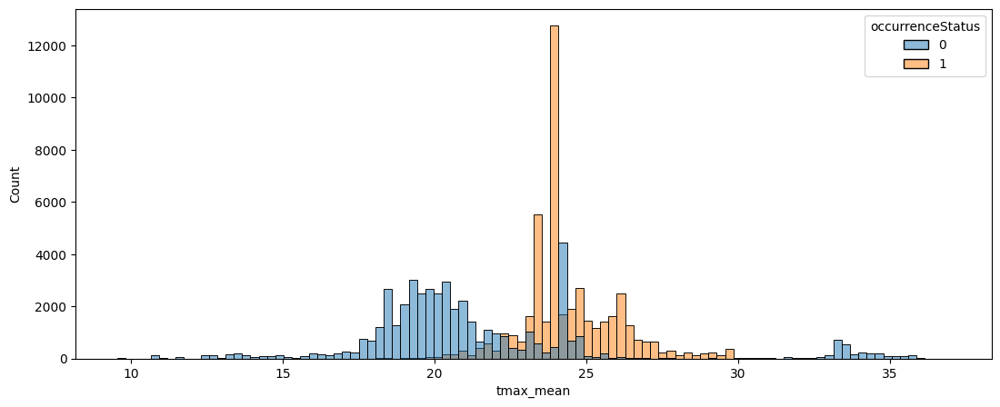

In [82]:

plt.figure(figsize=(13, 5))
sns.histplot(data=model_data, x='tmax_mean', hue='occurrenceStatus', bins=100)


<Axes: xlabel='tmin_mean', ylabel='Count'>

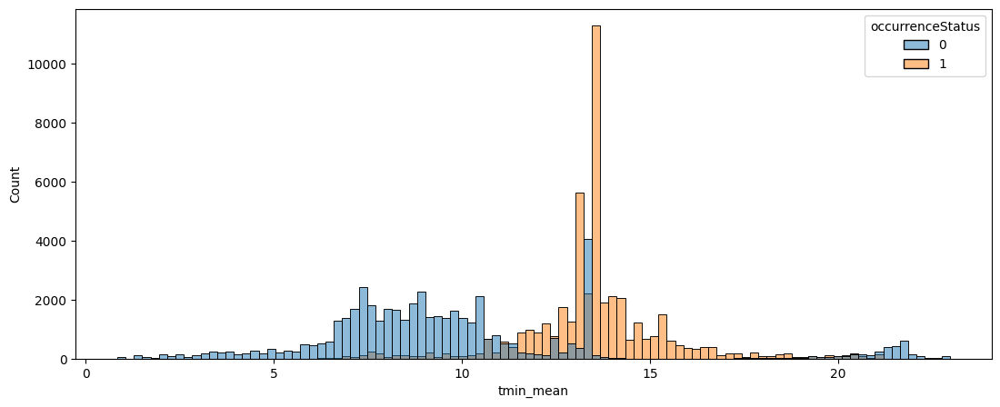

In [83]:

plt.figure(figsize=(13, 5))
sns.histplot(data=model_data, x='tmin_mean', hue='occurrenceStatus', bins=100)


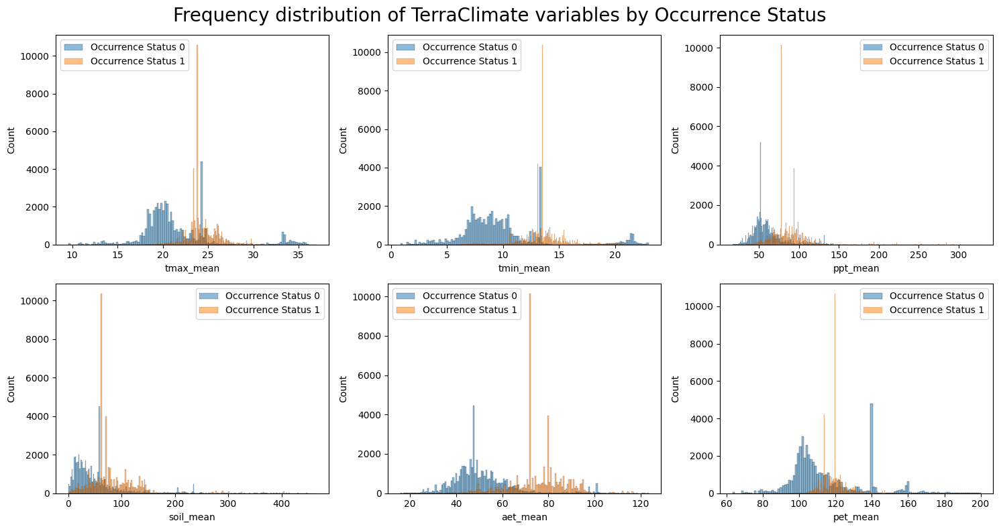

In [127]:
nrow = 2
ncol = 3  # Adjust the number of columns for the additional features
fig, ax = plt.subplots(nrow, ncol, figsize=(15, 8))

# List of all feature names including 'aet' and 'pet'
bands = ['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean', 'pet_mean']

occurrence_status_categories = model_data['occurrenceStatus'].unique()

for i, status in enumerate(occurrence_status_categories):
    data_subset = model_data[model_data['occurrenceStatus'] == status]
    for j in range(len(bands)):
        sns.histplot(data=data_subset, x=bands[j], ax=ax[j//ncol, j%ncol], alpha=0.5, label=f'Occurrence Status {status}')

for i in range(nrow):
    for j in range(ncol):
        ax[i, j].legend()

fig.suptitle("Frequency distribution of TerraClimate variables by Occurrence Status", fontsize=20)
plt.tight_layout()
plt.show()


In [87]:
model_data.drop(['gbifID', 'eventDate', 'decimalLatitude', 'decimalLongitude', 'species','country', 'continent', 'stateProvince', 'key', 'region', 'species_encoded'], axis=1, inplace=True)

In [88]:
model_data.head()

,occurrenceStatus,aet_mean,pet_mean,ppt_mean,soil_mean,tmax_mean,tmin_mean
0,0,47.598334,140.043336,52.176667,58.045001,24.345166,13.365333
1,0,44.343334,101.368335,50.091667,13.678334,19.437166,5.848833
2,0,71.668335,97.538335,80.643333,134.446668,19.647166,8.584666
3,0,51.881668,110.875003,58.223333,21.965001,20.368833,7.130333
4,0,25.610000,129.635002,26.961667,1.223333,23.634166,10.057000


In [89]:
# model_data['tmin_bin'] = model_data['tmin_mean'].apply(lambda x: 0 if x < 11.0 or x > 19.9 else 1)
# correlation = model_data[['tmin_bin', 'occurrenceStatus']].corr()
# print(correlation)

In [90]:
# model_data['tmax_bin'] = model_data['tmax_mean'].apply(lambda x: 0 if x < 22.1 or x > 31.2 else 1)
# correlation = model_data[['tmax_bin', 'occurrenceStatus']].corr()
# print(correlation)

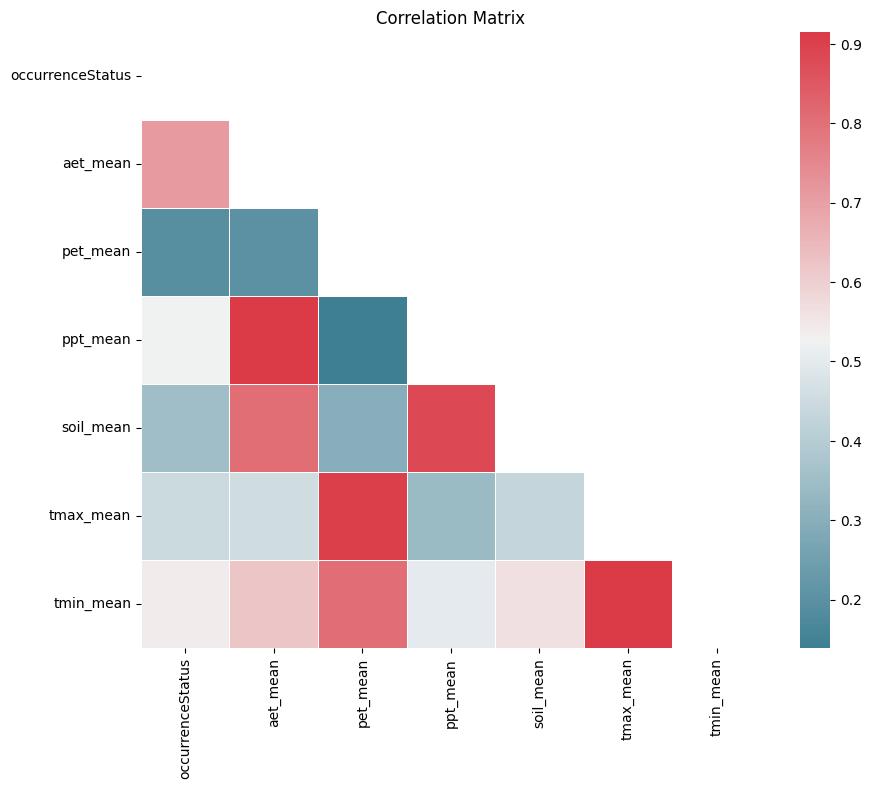

In [91]:
corr_matrix = model_data.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
fig, ax = plt.subplots(figsize=(10, 8))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, annot=True, fmt=".2f", linewidths=0.5, ax=ax)
ax.set_title("Correlation Matrix")
plt.show()


In [92]:
# variables_to_transform = ['tmax_mean', 'tmin_mean', 'soil_mean', 'ppt_mean']

# # Apply logarithmic transformation
# model_data[variables_to_transform] = np.log1p(model_data[variables_to_transform])

# # Check the skewness after transformation
# skewness_after_transformation = model_data[variables_to_transform].skew()
# print("Skewness after transformation:")
# print(skewness_after_transformation)


In [93]:
# fig, axs = plt.subplots(2, 2, figsize=(13, 8))

# # Get the list of variable names excluding 'occurrenceStatus'
# variables = [var for var in model_data.columns if var != 'occurrenceStatus']

# # Plot histogram for each variable
# for i, variable in enumerate(variables):
#     axs[i//2, i%2].hist(model_data[variable], bins=20)
#     axs[i//2, i%2].set_title(variable)
#     axs[i//2, i%2].set_xlabel('Value')
#     axs[i//2, i%2].set_ylabel('Frequency')

# # Adjust spacing between subplots
# fig.tight_layout()

# # Show the plots
# plt.show()


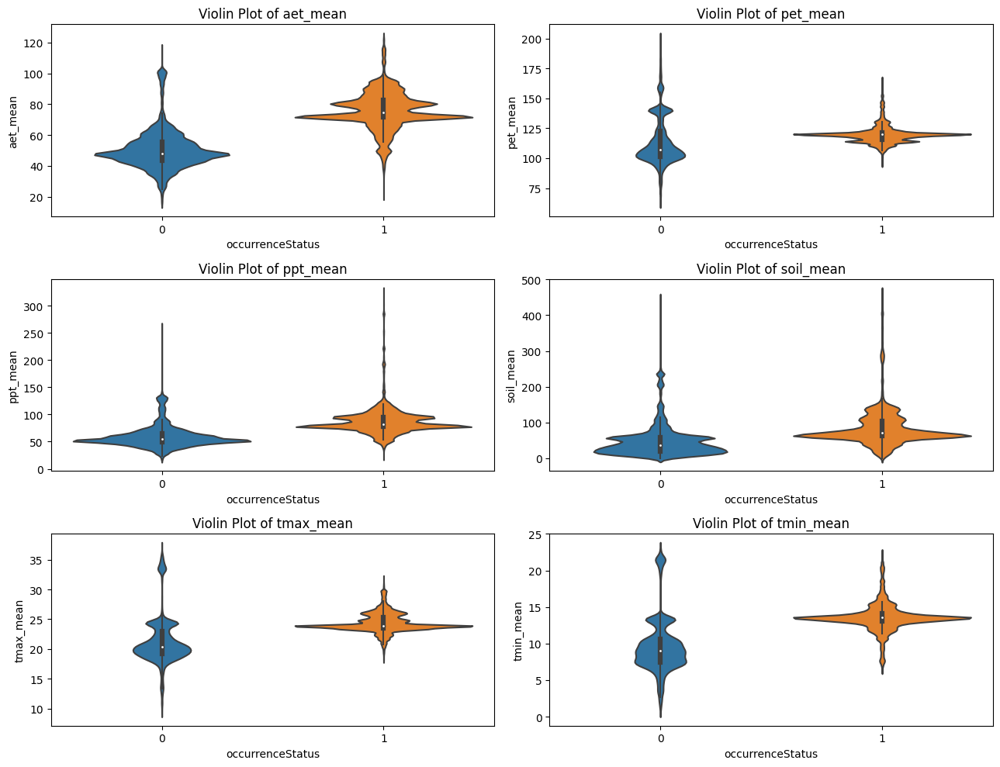

In [95]:
# Select the first 6 features (excluding 'occurrenceStatus')
features_to_plot = model_data.columns[1:7]

# Create a figure and subplot grid
fig, axs = plt.subplots(3, 2, figsize=(13, 10))

# Create box plots for each selected feature with hue as occurrenceStatus
for i, feature in enumerate(features_to_plot):
    sns.violinplot(x='occurrenceStatus', y=feature, data=model_data, ax=axs[i//2, i%2])
    axs[i//2, i%2].set_title(f'Violin Plot of {feature}')

# Adjust spacing between subplots
fig.tight_layout()

# Show the plots
plt.show()


In [64]:
# # Remove rows with ppt_mean values above 4.0
# model_data = model_data[model_data['ppt_mean'] <= 4.0]

# # Remove rows with soil_mean values above 3.0
# model_data = model_data[model_data['soil_mean'] <= 3.0]

# # Remove rows with tmax_mean values below 3.45
# model_data = model_data[model_data['tmax_mean'] >= 3.45]

# # Remove rows with tmin_mean values above 3.1 or below 2.8
# model_data = model_data[(model_data['tmin_mean'] <= 3.1) & (model_data['tmin_mean'] >= 2.8)]


In [96]:
model_data.dropna(inplace=True)

In [97]:
model_data.shape

(92395, 7)

In [98]:
model_data.head()

,occurrenceStatus,aet_mean,pet_mean,ppt_mean,soil_mean,tmax_mean,tmin_mean
0,0,47.598334,140.043336,52.176667,58.045001,24.345166,13.365333
1,0,44.343334,101.368335,50.091667,13.678334,19.437166,5.848833
2,0,71.668335,97.538335,80.643333,134.446668,19.647166,8.584666
3,0,51.881668,110.875003,58.223333,21.965001,20.368833,7.130333
4,0,25.610000,129.635002,26.961667,1.223333,23.634166,10.057000


In [99]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, r2_score

# Train-test split
X = model_data.drop('occurrenceStatus', axis=1)
y = model_data['occurrenceStatus']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Initialize and fit the model
full_model = RandomForestClassifier()
full_model.fit(X_train, y_train)

# Predictions
y_pred_train = full_model.predict(X_train)
y_pred_test = full_model.predict(X_test)
y_pred_proba_train = full_model.predict_proba(X_train)[:, 1]
y_pred_proba_test = full_model.predict_proba(X_test)[:, 1]

# Calculate evaluation metrics
train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)
precision = precision_score(y_test, y_pred_test)
recall = recall_score(y_test, y_pred_test)
f1 = f1_score(y_test, y_pred_test)
roc_auc = roc_auc_score(y_test, y_pred_proba_test)
r2 = r2_score(y_test, y_pred_test)  # R2 score is not applicable for classification tasks

# Print evaluation metrics
print("Training Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC Score:", roc_auc)
print("R2 Score:", r2)

Training Accuracy: 0.9999690766281155
Test Accuracy: 0.9982683357985497
Precision: 0.9987639060568603
Recall: 0.9977482385414397
F1 Score: 0.9982558139534884
ROC AUC Score: 0.9998272204990261
R2 Score: 0.9930730346400747


- Training Accuracy: 0.9999690766281155
- Test Accuracy: 0.9980518777733685
- Precision: 0.9987633665527024
- Recall: 0.9973124137430086
- F1 Score: 0.9980373627971215
- ROC AUC Score: 0.9998453486281847
- R2 Score: 0.992207163970084

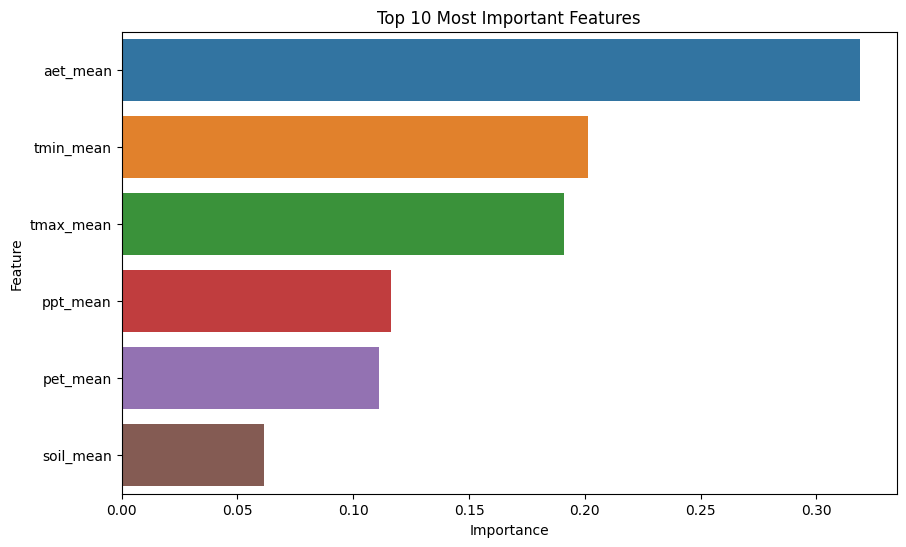

In [100]:
# Get feature importances
feature_importances = full_model.feature_importances_

# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the top n most important features
n = 10  # Number of top features to plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(n))
plt.title(f'Top {n} Most Important Features')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [42]:
# from tqdm import tqdm
# from sklearn.model_selection import GridSearchCV
# from sklearn.ensemble import RandomForestClassifier

# # Define the hyperparameters to tune
# param_grid = {
#     'n_estimators': [50, 100, 200],
#     'max_depth': [None, 10, 20, 30],
#     # 'min_samples_split': [2, 5, 10],
#     # 'min_samples_leaf': [1, 2, 4],
#     'max_features': ['auto', 'sqrt', 'log2']
# }

# # Initialize the progress bar
# progress_bar = tqdm(total=len(param_grid['n_estimators']) * len(param_grid['max_depth']) * len(param_grid['max_features']))

# # Create the grid search object
# grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), param_grid=param_grid, cv=5, scoring='accuracy')

# # Perform the grid search on the training data
# grid_search.fit(X_train, y_train)

# # Close the progress bar
# progress_bar.close()

# # Get the best hyperparameters
# best_params = grid_search.best_params_
# print("Best Hyperparameters:", best_params)

# # Get the best model
# best_model = grid_search.best_estimator_

# # Evaluate the best model
# train_accuracy = best_model.score(X_train, y_train)
# test_accuracy = best_model.score(X_test, y_test)

# print("Training Accuracy:", train_accuracy)
# print("Test Accuracy:", test_accuracy)


### Model Prediction

#### Predict Training Set

Logistic regression is a machine learning model that estimates the probability of a binary response variable. In our case, the model will output the probability of a frog being present at a given location. To obtain the predictions for our training set, we simply use the `predict` method on our trained model. We will evaluate these predictions in the evaluation section of this notebook.

In [101]:
predictions = full_model.predict(X_test)

In [102]:
y_test.value_counts()

occurrenceStatus
0    13952
1    13767
Name: count, dtype: int64

In [103]:
counts = np.bincount(predictions)
count_0s = counts[0]
count_1s = counts[1]

count_0s, count_1s

(13966, 13753)

#### Predict Entire Region

For a species distribution model to be effective, it must also be capable of performing predictions over the entire region, not just the points in our training set. To do this, we will define another function called `predict_frogs` that will take our interpolated predictor variable image in, along with our logistic regression model, and output the probabilities for each pixel in the region. We will visualise these predictions in a heatmap in the results section of this notebook.

This function will be used later to predict the test regions for the challenge. 


In [104]:
def predict_frogs(predictor_image, model):
    """Returns a (1, n, m) xarray where each pixel value corresponds to the probability of a frog occurrence.
    
    Takes in the multi-band image outputted by the `create_predictor_image` function as well as the
    trained model and returns the predictions for each pixel value. Firstly, the $x$ and $y$ indexes
    in the predictor image are stacked into one multi-index $z=(x, y)$ to produce an $k\times n$
    array, which is the format required to feed into our logistic regression model. Then, the array
    is fed into the model, returning the model's predictions for the frog likelihood at each pixel. 
    The predicted probabilities are then indexed by the same multi-index $z$ as before, which allows 
    the array to be unstacked and returned as a one-band image, ready for plotting.

    Arguments:
    predictor_image -- (K, n, m) xarray, where K is the number of predictor variables.
    model -- sklearn model with K predictor variables.
    """
    # Stack up pixels so they are in the appropriate format for the model
    predictor_image = predictor_image.stack(z=("y", "x")).transpose()
    # Reorder variables to be in same order as model
    predictor_image = predictor_image.sel(band=model.feature_names_in_)
    # Location of null values so that we can skip them (prediction model will break if nulls are present)
    null_pixels = (np.sum(predictor_image.isnull(), axis=-1) > 0)
    # Empty probabilities array
    probabilities = np.zeros((len(null_pixels), 2))
    # Calculate probability for each non-null pixel point
    probabilities[~null_pixels] = model.predict_proba(
        predictor_image[~null_pixels]
    )
    # Set null pixels to a probability of null
    probabilities[null_pixels] = np.array([np.nan, np.nan])
    # Just take probability of frog (class=1)
    probabilities = probabilities[:,1]
    # Add the coordinates to the probabilities, saving them in an xarray
    resultant_image = xr.DataArray(
        data=probabilities,
        dims=['z'],
        coords=dict(
            z=predictor_image.z
        )
    )
    # Unstack the image
    resultant_image = resultant_image.unstack()
    return resultant_image

# Calculate probability for each pixel point 
resultant_image = predict_frogs(weather_data, full_model)

### Model Evaluation

Now that we have trained our model and made some predictions, all that is left is to evaluate it. We will do this by first visualising the output of the model with a probability heatmap. Then, we will evaluate both its in-sample and out-of-sample performance using the training set we have generated.

#### In-Sample Evaluation

In the last section, we made our predicitons for the training set and stored them in the `predictions` variable. We can now calculate some performance metrics to guage the effectiveness of the model. It must be stressed that this is the in-sample performance - the performance on the training set. Hence, the values will tend to overestimate its performance. Additionally, the training set itself is biased and this notebook only took naive approaches to address this. The model evaluation metrics are only as good as the data used to evaluate it, so the metrics themselves will also be biased. Thus, these metrics are NOT truly indicative of this model's performance. 

In this example, we will use `f1_score` and `accuracy_score` from Scikit-learn. Scikit-learn provides many other metrics that can be used for evaluation. You can even code your own if you think it will assist you in evaluating your model.


In [105]:
print(f"F1 Score: {np.mean(f1_score(y_test, predictions)).round(2)}")
print(f"Accuracy: {np.mean(accuracy_score(y_test, predictions)).round(2)}")

F1 Score: 1.0
Accuracy: 1.0


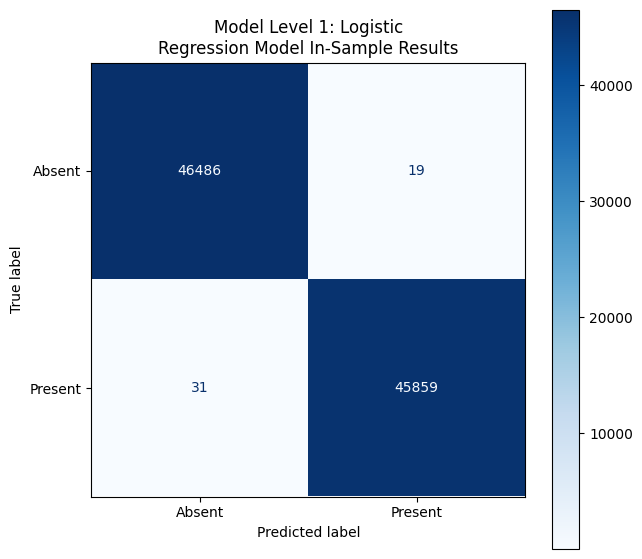

In [106]:
# Visualise the results in a confusion matrix
disp = ConfusionMatrixDisplay.from_estimator(full_model, X, y, display_labels=['Absent', 'Present'], cmap='Blues')
disp.figure_.set_size_inches((7, 7))
disp.ax_.set_title('Model Level 1: Logistic\nRegression Model In-Sample Results')
plt.show()

From above, we see that the model is able to achieve an ok F1 score and accuracy. From the confusion matrix, we can see that our model seems to confuse absent points with present points aka false positives, as shown in the top right corner. There may be many reasons for this, and a great way of understanding what might be causing the model's high false positive rate is to visualise its performance over the training region. We do this by plotting a probabilty heatmap in the section below.


#### Probability Heatmap

To create the probability heatmap, we write a function called `plot_heatmap`. This function will take in the model predictions from the entire region as stored in the `resultant_image` variable, and visualise these probabilities as a heatmap. In addition to the heatmap, we will also plot the actual map of the area in question, and the binary classification regions of the probability heatmap. The latter is simply a binary mask of the probability heatmap, 1 where the probability is greater than 0.5 and 0 elsewhere. 

To help visualise the effectiveness of our model, we plot the target species occurrences over top of each image. This can give us an idea of where our model is doing well, and where it is doing poorly. Particularly, we are interested in the high false positive rate.

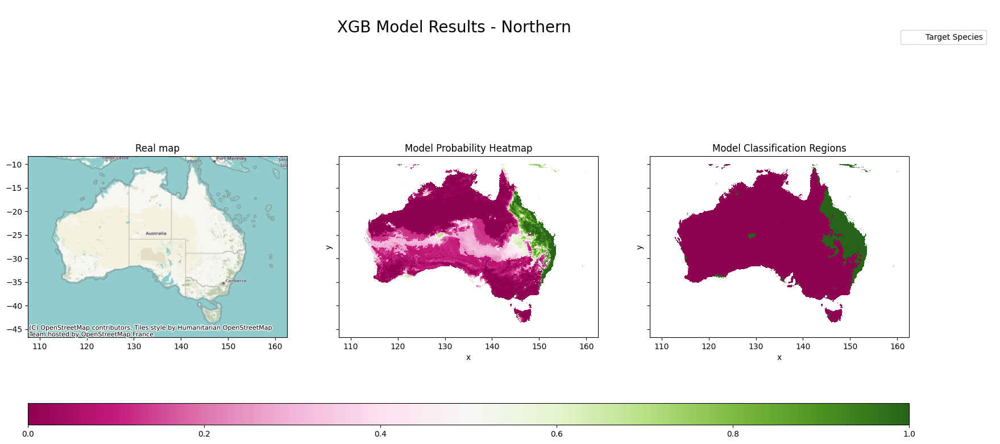

In [110]:
def plot_heatmap(resultant_image, frog_data, title, crs = {'init':'epsg:4326'}):
    """Plots a real map, probability heatmap, and model classification regions for the probability image from our model.

    Arguments:
    resultant_image -- (1, n, m) xarray of probabilities output from the model
    frog_data -- Dataframe of frog occurrences, indicated with a 1 in the occurrenceStatus column. 
                 Must contain ["occurrenceStatus", "decimalLongitude", "decimalLatitude"]
    title -- string that will be displayed as the figure title
    crs -- coordinate reference system for plotting the real map. Defaults to EPSG:4326.
    """
    fig, ax = plt.subplots(1, 3, figsize = (20, 10), sharex=True, sharey=True)
    extent = [resultant_image.x.min(),resultant_image.x.max(),resultant_image.y.min(),resultant_image.y.max()]
    cmap = 'PiYG'

    # Plot real map
    ax[0].scatter(x=[extent[0], extent[1]], y=[extent[2], extent[3]], alpha=0)
    cx.add_basemap(ax[0], crs=crs)
    ax[0].set_title('Real map')
    
    # Plot heatmap from model
    heatmap = resultant_image.plot.imshow(
        x='x', y='y', ax=ax[1], cmap=cmap, vmin=0, vmax=1, interpolation='none', add_colorbar=False
    )
    ax[1].set_aspect('equal')
    ax[1].set_title('Model Probability Heatmap')

    # Plot binary classification from model
    regions = xr.where(resultant_image.isnull(), np.nan, resultant_image>0.5).plot.imshow(
            x='x', y='y', ax=ax[2], cmap=cmap, vmin=0, vmax=1, interpolation='none', add_colorbar=False
    )
    ax[2].set_aspect('equal')
    ax[2].set_title('Model Classification Regions')

    # Plot real frogs
    for i, axis in enumerate(ax):
        filt = frog_data.occurrenceStatus == 1
        axis.scatter(
            frog_data[filt].decimalLongitude, frog_data[filt].decimalLatitude, 
            color = 'dodgerblue', marker='.', alpha=0, label='Target Species' if i==0 else ''
        )

    fig.colorbar(heatmap, ax=ax, location = 'bottom', aspect=40)
    fig.legend(loc = (0.9, 0.9))
    fig.suptitle(title, x=0.5, y=0.9, fontsize=20)
    
plot_heatmap(resultant_image, frog_data, f"XGB Model Results - {region_name}")

From the plots above, we can see that the model does a pretty good job of mapping where litoria fallax is. However, our performance metrics before suggested otherwise. The main limitation of the evaluation metrics comes from the pseudo absence species, crinia signifera, sharing much of the same habitat as litoria fallax. This paired with the relatively coarse spatial resolution of TerraClimate makes distinguising close habitats difficult. This explains the high rate of false positives, as there are many frog absence points within the green classification region. 

There are many ways you might go about addressing this issue. Perhaps choosing a species that does not closely share the same habitat as litoria fallax. Alternatively, a greater variety of spatial sampling could also resolve this issue, i.e. picking extra regions where only litoria fallax exists and some where only other species exist. Another option is to abandon the pseudo-absence approach entirely and develop a unique way of sampling for absence points. Ultimately, you might think it is worthwhile improving the training set to make your evaluation metrics a little more representative of the SDM performance. 



#### Out-of-Sample Evaluation

When evaluating a machine learning model, it is essential to correctly and fairly evaluate the model's ability to generalise. This is because models have a tendancy to overfit the dataset they are trained on. To estimate the out-of-sample performance, we will use k-fold cross-validation. This technique involves splitting the training dataset into folds, in this case we will use 10. Each iteration, the model is trained on all but one of the folds, which is reserved for testing. This is repeated until all folds have been left out once. At the end of the process, we will have 10 metrics which can be averaged, giving a more reliable and valid measure of model performance. 

Scikit-learn has built-in functions that can assist in k-fold cross validation. In particular, we will use `StratifiedKFold` to split our data into folds, ensuring there is always a balanced number of frogs and non-frogs in each fold.

Again, these metrics are derived from a biased sample, so be careful what you infer.


To address this issue, I have implemented a strategy to remove overlap points while retaining data for Litoria Fallax. By selectively dropping occurrences of Crinia Signifera and other overlapping species that closely share habitat with Litoria Fallax, I aim to refine the training set and improve the representativeness of our evaluation metrics. This approach allows us to focus on modeling the distribution of Litoria Fallax more accurately, mitigating the influence of overlapping habitats on model performance.

In [111]:
cv_model = RandomForestClassifier()

n_folds = 10

skf = StratifiedKFold(n_splits=n_folds, random_state=420, shuffle=True)
metrics = {'F1': f1_score, 'Accuracy': accuracy_score}
results = {'predicted':[], 'actual':[]}
scores = {'F1': [], 'Accuracy': []}

# Reset index before splitting
X = X.reset_index(drop=True)
y = y.reset_index(drop=True)

for i, (train_index, test_index) in enumerate(skf.split(X, y)):
    # Split the dataset
    print(f"Fold {i+1} of {n_folds}")
    X_train, X_test = X.loc[train_index], X.loc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Fit the model with the training set
    cv_model.fit(X_train, y_train)
    
    predictions = cv_model.predict(X_test)
    
    for metric, fn in metrics.items():
        scores[metric].append(fn(y_test, predictions))
        
    results['predicted'].extend(predictions)
    results['actual'].extend(list(y_test))
        
print(f'\nMetrics averaged over {n_folds} trials:')
for metric, result in scores.items():
    print(f"{metric}: {np.mean(result).round(2)}")
    

Fold 1 of 10
Fold 2 of 10
Fold 3 of 10
Fold 4 of 10
Fold 5 of 10
Fold 6 of 10
Fold 7 of 10
Fold 8 of 10
Fold 9 of 10
Fold 10 of 10

Metrics averaged over 10 trials:
F1: 1.0
Accuracy: 1.0


The results from the 10-fold cross validation are similar than the in-sample metrics. This is a good sign as it shows that we haven't overfit our model. We see similar behavour in the higher rate of false positives that we saw in the in-sample performance. 

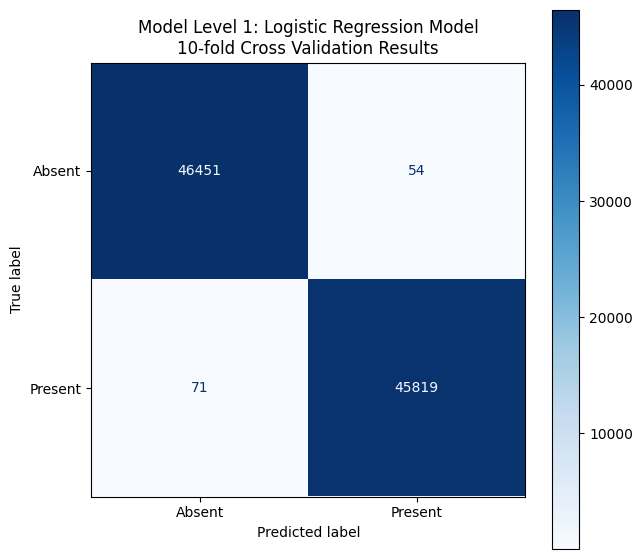

In [112]:
# Visualise the results in a confusion matrix
disp = ConfusionMatrixDisplay.from_predictions(results['actual'], results['predicted'], display_labels=['Absent', 'Present'], cmap='Blues')
disp.figure_.set_size_inches((7, 7))
disp.ax_.set_title('Model Level 1: Logistic Regression Model\n10-fold Cross Validation Results')
plt.show()

The results from the 10-fold cross validation are similar than the in-sample metrics. This is a good sign as it shows that we haven't overfit our model. We see similar behavour in the higher rate of false positives that we saw in the in-sample performance. 

---

---

---

## Submission

Once you are happy with your model, there will come a time to make a submission to the challenge. To make a submission, you will need to use your model to make predictions about the presence of litoria fallax for a set of test coordinates we have provided. The coordinates are found in the 'challenge_1_submission.csv' file, and the list of bounding boxes where the points were sampled from can be found separately in the 'challenge_1_test_regions.txt' file. We recommend looping through the regions identified in that file, pulling the TerraClimate data for that region, and extracting the features for each point in the 'test_1_occurrences.csv' file within that regions bounding box. This will minimise the computational requirements.

In [113]:
# Load in test coordinates
test_file = pd.read_csv('Level_1_challenge_1_submission_template.csv')

In [114]:
test_file

,id,decimalLatitude,decimalLongitude,occurrenceStatus
0,0,-37.917146,145.207706,NaN
1,1,-37.750974,144.981501,NaN
2,2,-37.961600,145.348000,NaN
3,3,-37.621300,145.003000,NaN
4,4,-38.498100,145.647000,NaN
...,...,...,...,...
4046,4046,-31.884385,116.150192,NaN
4047,4047,-32.412962,115.779737,NaN
4048,4048,-32.147959,115.856628,NaN
4049,4049,-31.827000,116.238000,NaN


In [115]:
# Read in test regions
test_1_regions = []
present_directory = os.getcwd()

with open(present_directory + '/challenge_1_test_regions.txt', 'r') as file:
    for i, line in enumerate(file):
        if i > 0:
            test_1_regions.append(eval("("+line+")"))

In [116]:
# Load in regions and save as list of dictionaries.
test_regions = [{'title':i, 'bbox':bbox} for i, bbox in enumerate(test_1_regions)]

In [117]:
test_regions

[{'title': 0, 'bbox': (144.8, -38.5, 145.8, -37.5)},
 {'title': 1, 'bbox': (150.7, -33.5, 151.7, -32.5)},
 {'title': 2, 'bbox': (152.6, -29.0, 153.6, -28.0)},
 {'title': 3, 'bbox': (145.0, -17.7, 146.0, -16.7)},
 {'title': 4, 'bbox': (115.7, -32.5, 116.7, -31.5)}]

Loading data
Calculating mean
Calculating min
Calculating max


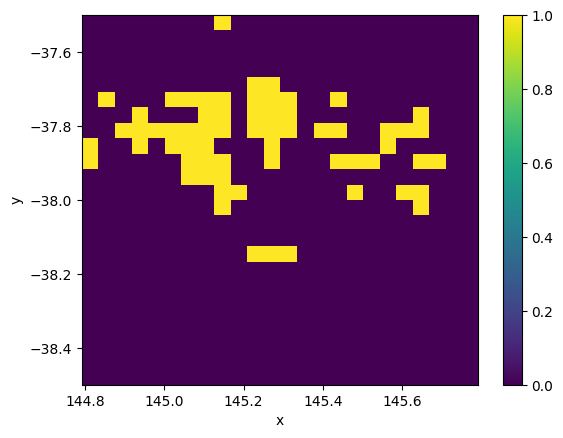

Loading data
Calculating mean
Calculating min
Calculating max


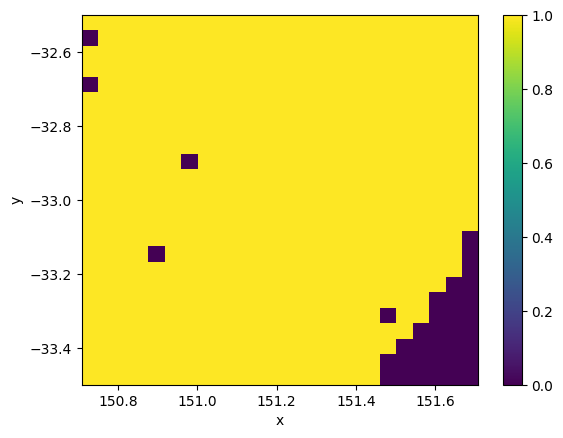

Loading data
Calculating mean
Calculating min
Calculating max


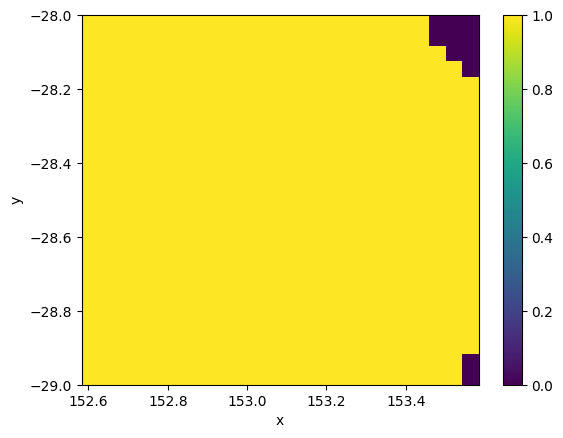

Loading data
Calculating mean
Calculating min
Calculating max


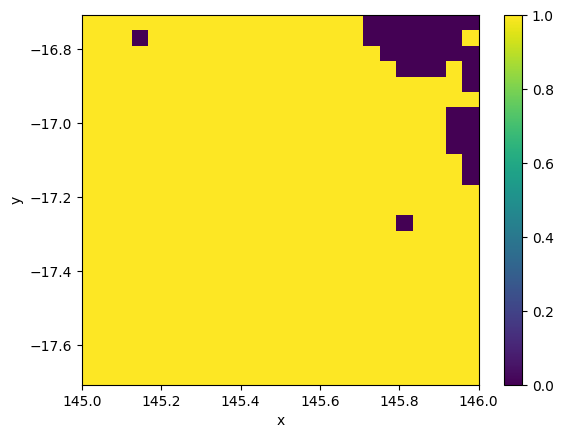

Loading data
Calculating mean
Calculating min
Calculating max


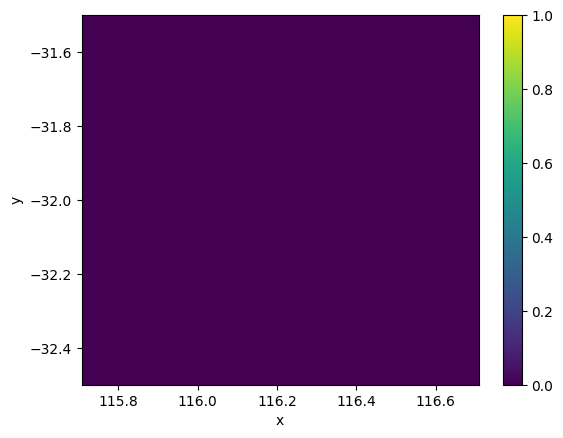

In [118]:
# Obtain predictor data for each region and get predictor image
for region in test_regions:
    region['coords'] = filter_bbox(test_file[['id', 'decimalLongitude', 'decimalLatitude']], region['bbox'])
    region['predictors'] = get_terraclimate(region['bbox'], tc_metrics, time_slice=time_slice, assets=assets, features=features)
    region['result'] = predict_frogs(region['predictors'], full_model) > 0.5
    region['result'].plot.imshow(x='x', y='y', vmin=0, vmax=1)
    plt.show()
    

In [119]:
predictions = pd.DataFrame()

for region in test_regions:
    preds = (
        region['result'].rename('occurrenceStatus')
        .sel(
            x=xr.DataArray(region['coords'].decimalLongitude, dims="id", coords={"id": region['coords'].id}), 
            y=xr.DataArray(region['coords'].decimalLatitude, dims="id", coords={"id": region['coords'].id}),
            method="nearest"
        )
        .to_dataframe()
        .reset_index()
        .rename(columns={'x':'decimalLongitude', 'y':'decimalLatitude'})
    )    
    predictions = pd.concat([predictions, preds], axis=0)

if 'occurenceStatus' in test_file.columns:
    test_file.drop(columns={'occurrenceStatus'}, inplace=True)

submission = (    
    predictions.merge(
        test_file, 
        on=['id'], 
        suffixes = ('_', ''))
)
submission['occurrenceStatus'] = submission['occurrenceStatus_'] * 1
submission = submission[['id', 'decimalLatitude', 'decimalLongitude', 'occurrenceStatus']]

submission

,id,decimalLatitude,decimalLongitude,occurrenceStatus
0,0,-37.917146,145.207706,0
1,1,-37.750974,144.981501,0
2,2,-37.961600,145.348000,0
3,3,-37.621300,145.003000,0
4,4,-38.498100,145.647000,0
...,...,...,...,...
4046,4046,-31.884385,116.150192,0
4047,4047,-32.412962,115.779737,0
4048,4048,-32.147959,115.856628,0
4049,4049,-31.827000,116.238000,0


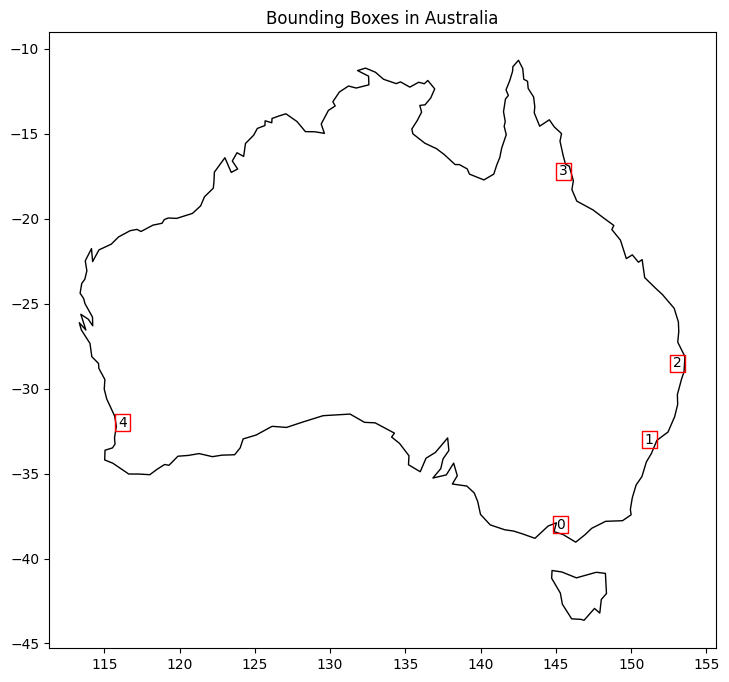

In [120]:
# Create a GeoDataFrame with the bounding boxes and region names
geometries = [box(bbox[0], bbox[1], bbox[2], bbox[3]) for bbox in [region['bbox'] for region in test_regions]]
gdf = gpd.GeoDataFrame(geometry=geometries, crs='EPSG:4326')
gdf['Region'] = [region['title'] for region in test_regions]

# Load a map of Australia
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Plot the map of Australia
ax = world[world.name == 'Australia'].plot(color='white', edgecolor='black', figsize=(10, 8))

# Plot the bounding boxes on top of the map
gdf.plot(ax=ax, color='none', edgecolor='r')

# Annotate the regions
for x, y, label in zip(gdf.geometry.centroid.x, gdf.geometry.centroid.y, gdf['Region']):
    ax.text(x, y, label, fontsize=10, ha='center', va='center', color='black')

# Set title
ax.set_title('Bounding Boxes in Australia')

# Show plot
plt.show()


In [121]:
predictions = pd.DataFrame()

for region in test_regions:
    preds = (
        region['result'].rename('occurrenceStatus')
        .sel(
            x=xr.DataArray(region['coords'].decimalLongitude, dims="id", coords={"id": region['coords'].id}), 
            y=xr.DataArray(region['coords'].decimalLatitude, dims="id", coords={"id": region['coords'].id}),
            method="nearest"
        )
        .to_dataframe()
        .reset_index()
        .rename(columns={'x':'decimalLongitude', 'y':'decimalLatitude'})
    )
    predictions = pd.concat([predictions, preds], ignore_index=True)
            
submission = (    
    predictions.merge(
        test_file, 
        on=['decimalLongitude', 'decimalLatitude'], 
        how='left', suffixes=('', '_'))
    [test_file.columns]
    .fillna(0)
    .astype({col:'int' for col in test_file.columns[3::]})
)


In [122]:
display(submission)
# Save to output folder
submission.to_csv(present_directory + '/my_challenge_1_submission.csv', index=None)

,id,decimalLatitude,decimalLongitude,occurrenceStatus
0,0,-37.937500,145.187500,0
1,1,-37.770833,144.979167,0
2,2,-37.979167,145.354167,0
3,3,-37.604167,145.020833,0
4,4,-38.479167,145.645833,0
...,...,...,...,...
4046,4046,-31.895833,116.145833,0
4047,4047,-32.395833,115.770833,0
4048,4048,-32.145833,115.854167,0
4049,4049,-31.812500,116.229167,0


In [123]:
submission['occurrenceStatus'].value_counts()

occurrenceStatus
1    2286
0    1765
Name: count, dtype: int64